# **1. Import Dependencies**

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.sparse.csgraph import dijkstra
import networkx as nx

In [ ]:
from matplotlib.collections import LineCollection

# **2. Testing Grounds**

In [ ]:
CANVAS_SIZE = 1000
NUM_STATIONS = 10
ISLAND_PENALTY = 5000

In [ ]:
CANVAS = tf.fill((CANVAS_SIZE, CANVAS_SIZE), 0).numpy()

In [ ]:
STATION_IDXS = tf.random.uniform(
    shape=(NUM_STATIONS, 2),
    minval=0,
    maxval=CANVAS_SIZE-1,
    dtype=tf.int32
).numpy()

STATION_IDXS

array([[622, 767],
       [634, 379],
       [871, 737],
       [722, 575],
       [375, 537],
       [174, 327],
       [711, 193],
       [633, 863],
       [915, 855],
       [ 51, 360]], dtype=int32)

In [ ]:
STATION_SIZES = tf.random.normal(
    shape=(NUM_STATIONS,),
    mean=400.0,
    stddev=200.0,
    dtype=tf.float32
).numpy()

STATION_SIZES

array([507.6605 , 158.0328 , 553.8029 , 249.02895, 432.29092, 362.8728 ,
       150.91238, 378.77795, 507.52817, 390.0605 ], dtype=float32)

In [ ]:
DEMAND = tf.random.uniform(
    shape=(NUM_STATIONS, NUM_STATIONS),
    minval=0,
    maxval=1
).numpy()

for col in range(NUM_STATIONS):
  colSum = np.sum(DEMAND[:, col])
  for row in range(NUM_STATIONS):
    DEMAND[row, col] = DEMAND[row, col] / colSum

DEMAND

array([[0.16409157, 0.10926066, 0.13823648, 0.11877894, 0.09150489,
        0.2005756 , 0.13340522, 0.13831279, 0.03963774, 0.0451775 ],
       [0.11249312, 0.08387559, 0.0551324 , 0.18934919, 0.24281819,
        0.08233911, 0.08721456, 0.10360979, 0.213666  , 0.09876557],
       [0.13899331, 0.11290245, 0.06417322, 0.1258992 , 0.04504202,
        0.00865442, 0.05421833, 0.13504072, 0.08883653, 0.10635913],
       [0.02201857, 0.17088588, 0.1193631 , 0.02959288, 0.00363039,
        0.14033736, 0.15248011, 0.12917441, 0.17425707, 0.14668216],
       [0.12406155, 0.14370625, 0.12430896, 0.05639188, 0.06527246,
        0.09222694, 0.20342083, 0.1380146 , 0.07603031, 0.09361706],
       [0.08491459, 0.01720216, 0.16866851, 0.12351149, 0.20910288,
        0.09116154, 0.08487459, 0.00133006, 0.1495599 , 0.00510058],
       [0.11442471, 0.01654615, 0.11891732, 0.07495987, 0.08636667,
        0.00890029, 0.13405389, 0.0675355 , 0.16223034, 0.1695283 ],
       [0.03716164, 0.12549546, 0.1568404

In [ ]:
TRIPS = np.array([[int(round(STATION_SIZES[start] * DEMAND[end, start])) for start in range(NUM_STATIONS)] for end in range(NUM_STATIONS)])

TRIPS

array([[ 83,  17,  77,  30,  40,  73,  20,  52,  20,  18],
       [ 57,  13,  31,  47, 105,  30,  13,  39, 108,  39],
       [ 71,  18,  36,  31,  19,   3,   8,  51,  45,  41],
       [ 11,  27,  66,   7,   2,  51,  23,  49,  88,  57],
       [ 63,  23,  69,  14,  28,  33,  31,  52,  39,  37],
       [ 43,   3,  93,  31,  90,  33,  13,   1,  76,   2],
       [ 58,   3,  66,  19,  37,   3,  20,  26,  82,  66],
       [ 19,  20,  87,  16,  30,  10,  10,   7,  25,  11],
       [ 78,  14,  11,   4,  49,  67,   0,  49,   4,  69],
       [ 25,  21,  19,  51,  32,  59,  12,  53,  19,  51]])

In [ ]:
FLOW = np.zeros((NUM_STATIONS, NUM_STATIONS), dtype=np.int32)

FLOW = TRIPS + TRIPS.T

for i in range(NUM_STATIONS):
  FLOW[i, i] = 0

FLOW

array([[  0,  74, 148,  41, 103, 116,  78,  71,  98,  43],
       [ 74,   0,  49,  74, 128,  33,  16,  59, 122,  60],
       [148,  49,   0,  97,  88,  96,  74, 138,  56,  60],
       [ 41,  74,  97,   0,  16,  82,  42,  65,  92, 108],
       [103, 128,  88,  16,   0, 123,  68,  82,  88,  69],
       [116,  33,  96,  82, 123,   0,  16,  11, 143,  61],
       [ 78,  16,  74,  42,  68,  16,   0,  36,  82,  78],
       [ 71,  59, 138,  65,  82,  11,  36,   0,  74,  64],
       [ 98, 122,  56,  92,  88, 143,  82,  74,   0,  88],
       [ 43,  60,  60, 108,  69,  61,  78,  64,  88,   0]])

In [ ]:
DISTANCES = np.zeros((NUM_STATIONS, NUM_STATIONS))

for i in range(NUM_STATIONS):
  for j in range(NUM_STATIONS):
    DISTANCES[i,j] = np.linalg.norm(STATION_IDXS[i]-STATION_IDXS[j])

DISTANCES

array([[  0.        , 388.18552266, 250.8007177 , 216.48094604,
        337.50407405, 627.9363025 , 580.85884688,  96.62815325,
        305.92973049, 701.2061038 ],
       [388.18552266,   0.        , 429.34019146, 214.84878403,
        303.389189  , 462.92980029, 201.30822139, 484.00103306,
        552.75401401, 583.30952332],
       [250.8007177 , 429.34019146,   0.        , 220.10224897,
        534.80463723, 808.64639986, 567.04144469, 269.29537686,
        125.93649193, 902.51260379],
       [216.48094604, 214.84878403, 220.10224897,   0.        ,
        349.07449062, 601.5047797 , 382.15834415, 301.43821921,
        340.07205119, 704.60343456],
       [337.50407405, 303.389189  , 534.80463723, 349.07449062,
          0.        , 290.69055712, 480.86588567, 415.74030355,
        626.67695027, 369.19507039],
       [627.9363025 , 462.92980029, 808.64639986, 601.5047797 ,
        290.69055712,   0.        , 553.46634947, 705.67485431,
        909.87086996, 127.34991166],
       [58

In [ ]:
FULL_TRACK = 0
for i in range(NUM_STATIONS):
  for j in range(i, NUM_STATIONS):
    FULL_TRACK += DISTANCES[i,j]

FULL_TRACK

21419.283752821437

In [ ]:
"""LINES = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))

LINES"""

'LINES = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))\n\nLINES'

In [ ]:
LINES = np.ones((NUM_STATIONS, NUM_STATIONS))

LINES

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [ ]:
def plot_system(CANVAS, LINES):
  # Draw canvas
  plt.imshow(CANVAS, cmap='Greys')

  # Draw flow/demand between stations
  demand_lines = []
  for i in range(NUM_STATIONS):
      for j in range(i + 1, NUM_STATIONS):
          demand_lines.append([(STATION_IDXS[i, 0], STATION_IDXS[i, 1]), (STATION_IDXS[j, 0], STATION_IDXS[j, 1])])
  lc_stations = LineCollection(demand_lines, alpha=0.75, linestyle='-', linewidths=TRIPS.flatten()/20)
  plt.gca().add_collection(lc_stations)

  # Draw metro lines between stations
  station_lines = []
  for i in range(NUM_STATIONS):
      for j in range(NUM_STATIONS):
          if LINES[i,j] == 1.0:
              station_lines.append([(STATION_IDXS[i, 0], STATION_IDXS[i, 1]), (STATION_IDXS[j, 0], STATION_IDXS[j, 1])])
  lc_stations = LineCollection(station_lines, alpha=1, color='black', linestyle='-', linewidths=1.5)
  plt.gca().add_collection(lc_stations)

  # Draw stations
  plt.scatter(STATION_IDXS[:,0], STATION_IDXS[:,1], s=STATION_SIZES, zorder=4)

  # Add station indices
  for i, (x, y, size) in enumerate(zip(STATION_IDXS[:, 0], STATION_IDXS[:, 1], STATION_SIZES)):
      fontsize = max(size**.8 * 0.1, 8)
      plt.annotate(str(i), (x, y), ha='center', va='center', size=fontsize, color='white', fontweight='bold', zorder=5)

  # Labels
  plt.title('MAP OF AREA')
  plt.xlabel('West/East')
  plt.ylabel('South/North')

  plt.show()

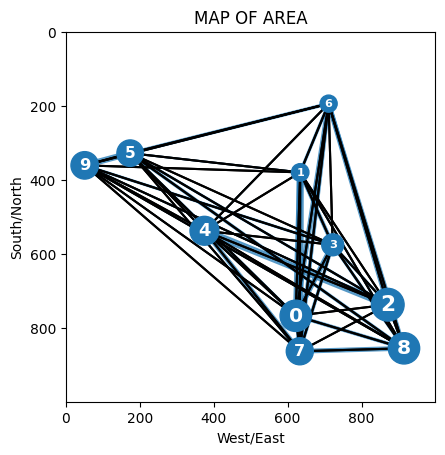

In [ ]:
plot_system(CANVAS, LINES)

In [ ]:
def find_shortest_path(adjacency_matrix, weight_matrix, source_node, target_node):
    try:
        # Create a directed graph from the matrices
        G = nx.from_numpy_array(adjacency_matrix, create_using=nx.DiGraph)

        # Add weights to the edges
        for i in range(G.number_of_nodes()):
            for j in range(G.number_of_nodes()):
                if G.has_edge(i, j):
                    G[i][j]['weight'] = weight_matrix[i, j]

        # Find the shortest path from source to target
        shortest_path = nx.shortest_path(G, source=source_node, target=target_node, weight='weight')

        # Calculate the sum of edge weights on the shortest path
        total_weight = sum(G[shortest_path[i]][shortest_path[i + 1]]['weight'] for i in range(len(shortest_path) - 1))

        return shortest_path, total_weight

    except nx.NetworkXNoPath:
        # Return -1 when there is no path between the nodes
        return -1, -1

In [ ]:
def get_min_dist(LINES, DISTANCES):
  MIN_DIST = np.zeros((NUM_STATIONS, NUM_STATIONS))

  for i in range(NUM_STATIONS):
    for j in range(NUM_STATIONS):
      shortest_path, total_weight = find_shortest_path(LINES, DISTANCES, i, j)
      MIN_DIST[i,j] = total_weight

  return MIN_DIST

In [ ]:
MIN_DIST = get_min_dist(LINES, DISTANCES)

MIN_DIST

array([[  0.        , 388.18552266, 250.8007177 , 216.48094604,
        337.50407405, 627.9363025 , 580.85884688,  96.62815325,
        305.92973049, 701.2061038 ],
       [388.18552266,   0.        , 429.34019146, 214.84878403,
        303.389189  , 462.92980029, 201.30822139, 484.00103306,
        552.75401401, 583.30952332],
       [250.8007177 , 429.34019146,   0.        , 220.10224897,
        534.80463723, 808.64639986, 567.04144469, 269.29537686,
        125.93649193, 902.51260379],
       [216.48094604, 214.84878403, 220.10224897,   0.        ,
        349.07449062, 601.5047797 , 382.15834415, 301.43821921,
        340.07205119, 704.60343456],
       [337.50407405, 303.389189  , 534.80463723, 349.07449062,
          0.        , 290.69055712, 480.86588567, 415.74030355,
        626.67695027, 369.19507039],
       [627.9363025 , 462.92980029, 808.64639986, 601.5047797 ,
        290.69055712,   0.        , 553.46634947, 705.67485431,
        909.87086996, 127.34991166],
       [58

In [ ]:
def get_flow_score(LINES, DISTANCES):
    MIN_DIST = get_min_dist(LINES, DISTANCES)

    # Vectorized computation of total distance
    total_dist = np.sum(np.where(MIN_DIST != -1, MIN_DIST * TRIPS, ISLAND_PENALTY * TRIPS))

    return total_dist / np.sum(TRIPS)

In [ ]:
F = get_flow_score(LINES, DISTANCES)

F

442.51775011366965

In [ ]:
BEST_SCORE = F

# **3. Evolution**

In [ ]:
CANVAS_SIZE = 1000
NUM_STATIONS = 10
ISLAND_PENALTY = 5000
TRACK_LIMIT = 3000

NUM_GENERATIONS = 100
POP_SIZE = 1000
CROSSOVER_RATE = 0.1
MUTATION_RATE = 0.01

PARENT_SHARE = 0.4
MUTATED_SHARE = 0.4
ELITE_SHARE = 0.2

NUM_PARENTS = int(PARENT_SHARE * POP_SIZE)
NUM_MUTANTS = int(MUTATED_SHARE * POP_SIZE)
NUM_ELITES = int(ELITE_SHARE * POP_SIZE)

TRACK_GEN = 0.55

In [ ]:
LINES_POP = np.round(TRACK_GEN * np.random.rand(POP_SIZE, NUM_STATIONS, NUM_STATIONS))

In [ ]:
LINES_POP[0]

array([[0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 1., 0.],
       [0., 1., 0., 0., 1., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

In [ ]:
# check avg track length
track_lens = np.zeros((POP_SIZE))
for pop in range(POP_SIZE):
  track_len = 0
  track = LINES_POP[pop] * DISTANCES
  for i in range(NUM_STATIONS):
    for j in range(i+1, NUM_STATIONS):
      if track[i,j] > 0 or track[j,i] > 0:
        track_len += DISTANCES[i,j]
  track_lens[pop] = track_len

avg_len = np.sum(track_lens) / POP_SIZE

avg_len

3741.491843996556

In [ ]:
# shorten lines if too much track is used
tasks = np.ones((POP_SIZE))
while np.sum(tasks) != 0:
  for pop in range(POP_SIZE):
    track_len = 0
    track = LINES_POP[pop] * DISTANCES
    for i in range(NUM_STATIONS):
      for j in range(i+1, NUM_STATIONS):
        if track[i,j] > 0 or track[j,i] > 0:
          track_len += DISTANCES[i,j]
    if track_len > TRACK_LIMIT:
      LINES_POP[pop] = np.round(TRACK_GEN * np.random.rand(NUM_STATIONS, NUM_STATIONS))
    else:
      tasks[pop] = 0

In [ ]:
# make sure all lines are within the track limit after shortening
for pop in range(POP_SIZE):
    track_len = 0
    track = LINES_POP[pop] * DISTANCES
    for i in range(NUM_STATIONS):
      for j in range(i+1, NUM_STATIONS):
        if track[i,j] > 0 or track[j,i] > 0:
          track_len += DISTANCES[i,j]
    print(track_len)

2840.1339665206374
2123.384879525115
2242.529780406009
2009.8885240854036
2322.24939403039
2598.8560851485445
2857.9768177511055
2614.2228413148
2765.5536561893155
2217.417246873937
2387.743061999843
1644.8353322336425
2764.3334708516322
2659.9918030621448
1513.7914453878418
2541.0696845650486
1441.6054617037394
2914.703616579428
2284.231448886087
1525.279188041358
1649.860630672114
1594.7876735281345
2742.881593666582
2734.157963733522
2467.6584389559985
2101.373541191703
2407.351731802418
2765.1526270520317
2632.611157376824
1441.993267823611
2732.409329281106
1767.9991922855645
2153.9304224178627
2654.1267072873843
1265.8277189040714
2510.9306614290945
1659.581205591291
2862.8512028966243
1424.4885110982943
1406.299961245234
2613.5940486354684
2323.8377283752325
1885.9663276739316
1393.1757764450085
2046.8459679797331
2519.0712394756297
1229.4410822004756
2335.3195297743546
2052.5775622651954
1942.4772620547276
2625.068337186371
1657.2871746560131
2830.7383404064685
2800.23345825439

In [ ]:
def evaluate(LINES_POP):
    LINES_SCORES = np.zeros((POP_SIZE))
    best_track_len = float('inf')

    for pop in range(POP_SIZE):
      LINES_SCORES[pop] = get_flow_score(LINES_POP[pop], DISTANCES)

      # Calculate track length for the current line
      track = LINES_POP[pop] * DISTANCES
      track_len = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if track[i,j] > 0 or track[j,i] > 0:
            track_len += DISTANCES[i,j]

      if track_len < best_track_len:
        best_track_len = track_len

    best_idx = np.argmin(LINES_SCORES)
    best_gen_score = LINES_SCORES[best_idx]
    best_line = LINES_POP[best_idx]
    avg_score = np.average(LINES_SCORES)

    return best_idx, best_gen_score, best_track_len, best_line, avg_score, LINES_SCORES

In [ ]:
def selection(LINES_SCORES):
    # Create shuffled indices
    shuffled_indices = np.random.permutation(len(LINES_SCORES))

    # Select parent indices
    parent_idxs = shuffled_indices[:NUM_PARENTS]

    # Select mutated indices
    mutated_idxs = shuffled_indices[NUM_PARENTS:NUM_PARENTS+NUM_MUTANTS]

    # Select elite indices
    elite_idxs = np.argsort(LINES_SCORES)[:NUM_ELITES]

    return parent_idxs, mutated_idxs, elite_idxs

In [ ]:
"""def check_track_limit(line):
    track_len = np.sum(line * DISTANCES)
    while track_len > TRACK_LIMIT:
        line = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))"""

'def check_track_limit(line):\n    track_len = np.sum(line * DISTANCES)\n    while track_len > TRACK_LIMIT:\n        line = np.round(0.7 * np.random.rand(NUM_STATIONS, NUM_STATIONS))'

In [ ]:
def crossover(parents):
  pairs = np.reshape(parents, (NUM_PARENTS // 2, 2, NUM_STATIONS, NUM_STATIONS))
  for pair_idx in range(np.shape(pairs)[0]):
    running = True
    pair = pairs[pair_idx]
    child0 = pair[0, :, :]
    child1 = pair[1, :, :]
    while running:
      # Slice along first axis
      for slice_idx in range(1, NUM_STATIONS):
        if np.random.rand() < CROSSOVER_RATE:
          child0 = np.concatenate((pair[0, :slice_idx, :], pair[1, slice_idx:, :]), axis=0)
          child1 = np.concatenate((pair[1, :slice_idx, :], pair[0, slice_idx:, :]), axis=0)

      # Slice along second axis
      for slice_idx in range(1, NUM_STATIONS):
        if np.random.rand() < CROSSOVER_RATE:
          temp0 = np.concatenate((child0[:, :slice_idx], pair[1, :, slice_idx:]), axis=1)
          temp1 = np.concatenate((child1[:, :slice_idx], pair[0, :, slice_idx:]), axis=1)
          # Update children
          child0 = temp0
          child1 = temp1

      # Check if track limits are satisfied
      track_len_1 = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if child0[i,j] > 0 or child0[j,i] > 0:
            track_len_1 += DISTANCES[i,j]

      track_len_2 = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if child1[i,j] > 0 or child1[j,i] > 0:
            track_len_2 += DISTANCES[i,j]

      if track_len_1 < TRACK_LIMIT and track_len_2 < TRACK_LIMIT:
        temp = np.array((child0, child1))
        pairs[pair_idx] = temp
        running = False
  pairs = np.reshape(pairs, (NUM_PARENTS, NUM_STATIONS, NUM_STATIONS))
  return pairs

In [ ]:
def mutation(mutants):
  for mutant_idx in range(NUM_MUTANTS):
    mutated = mutants[mutant_idx]
    running = True
    while running:
      # Mutate
      for i in range(NUM_STATIONS):
        for j in range(NUM_STATIONS):
          if np.random.rand() < MUTATION_RATE:
            if mutated[i, j] == 1:
              mutated[i, j] = 0
            else:
              mutated[i, j] = 1
      # Check lengths
      track_len = 0
      for i in range(NUM_STATIONS):
        for j in range(i+1, NUM_STATIONS):
          if mutated[i, j] > 0 or mutated[j, i] > 0:
            track_len += DISTANCES[i,j]
      # Loop end condition
      if track_len < TRACK_LIMIT:
        mutants[mutant_idx] = mutated
        running = False
      else:
        z_idxs = np.random.randint(0, NUM_STATIONS, size=(5, 2), dtype=np.int32)
        for idx in range(np.shape(z_idxs)[0]):
          i = z_idxs[idx][0]
          j = z_idxs[idx][1]
          mutated[i, j] = 0
          mutated[j, i] = 0
  return mutants

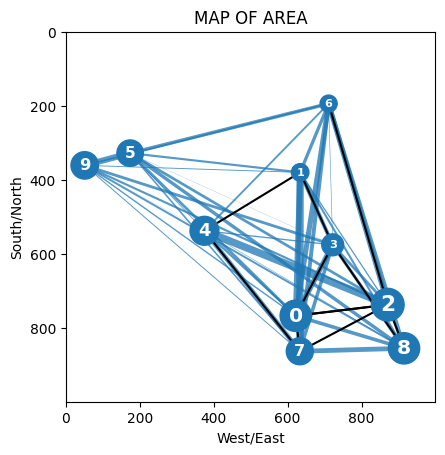

GENERATION #0
Best Score: 3092.403734348229
Track Length: 214.84878403193255
Average Score: 4230.882092761297
SCORE TO BEAT: 442.51775011366965


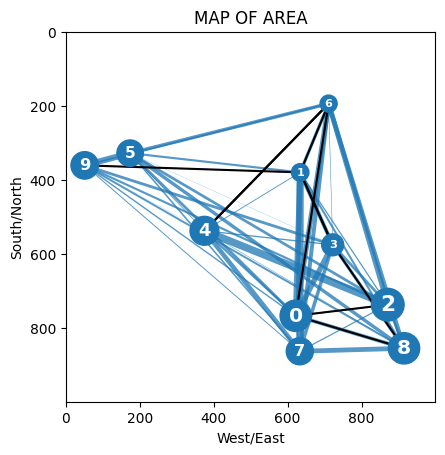

GENERATION #1
Best Score: 2748.4351220825183
Track Length: 250.80071770232237
Average Score: 4156.088396354023
SCORE TO BEAT: 442.51775011366965


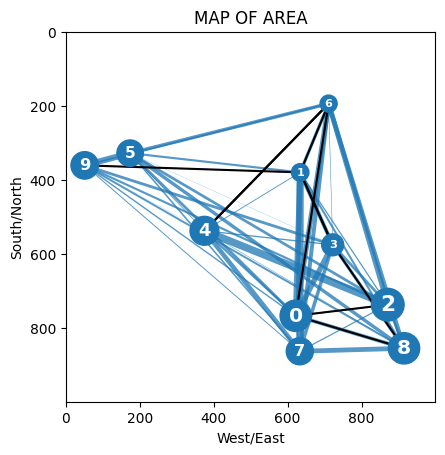

GENERATION #2
Best Score: 2748.4351220825183
Track Length: 480.865885668759
Average Score: 4068.916710694674
SCORE TO BEAT: 442.51775011366965


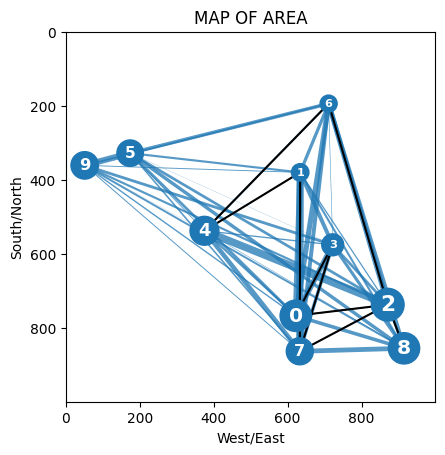

GENERATION #3
Best Score: 2695.7258103436175
Track Length: 250.80071770232237
Average Score: 3981.6259476986415
SCORE TO BEAT: 442.51775011366965


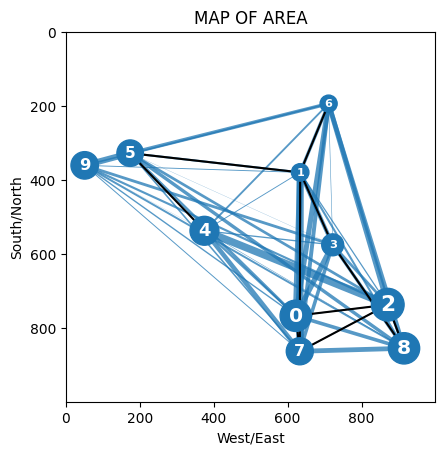

GENERATION #4
Best Score: 2173.867682269252
Track Length: 378.15062936306913
Average Score: 3898.3247378209853
SCORE TO BEAT: 442.51775011366965


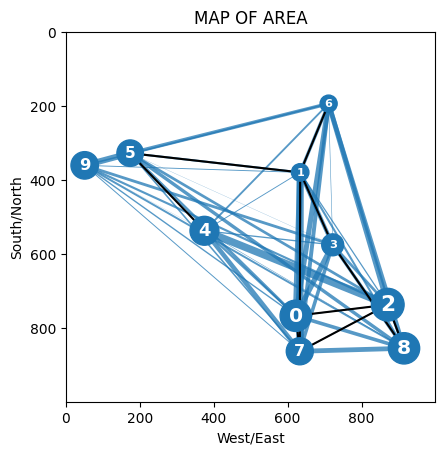

GENERATION #5
Best Score: 2173.867682269252
Track Length: 903.0595107109319
Average Score: 3832.0418417709247
SCORE TO BEAT: 442.51775011366965


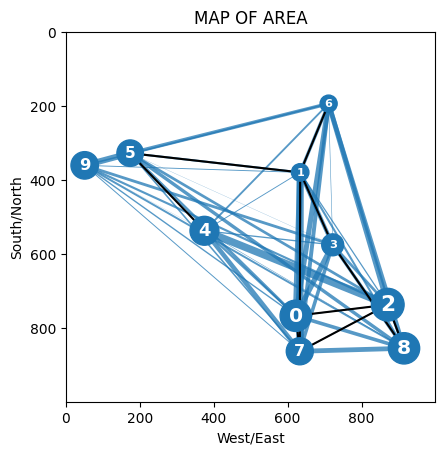

GENERATION #6
Best Score: 2173.867682269252
Track Length: 1127.2910943761387
Average Score: 3765.3360531827184
SCORE TO BEAT: 442.51775011366965


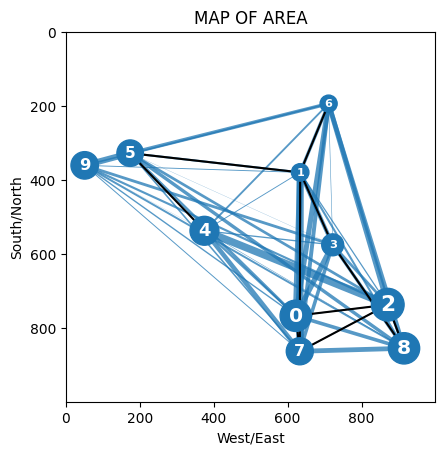

GENERATION #7
Best Score: 2173.867682269252
Track Length: 1180.6619703634747
Average Score: 3703.6824263253834
SCORE TO BEAT: 442.51775011366965


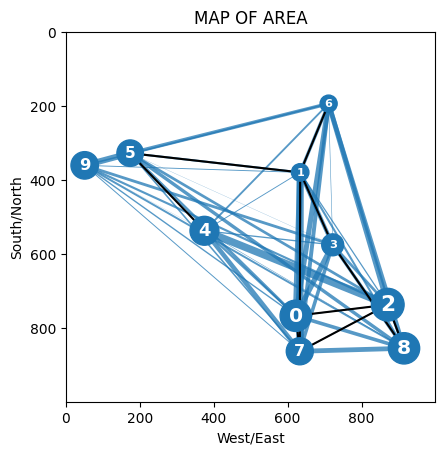

GENERATION #8
Best Score: 2173.867682269252
Track Length: 1271.9814006511385
Average Score: 3640.0639140239887
SCORE TO BEAT: 442.51775011366965


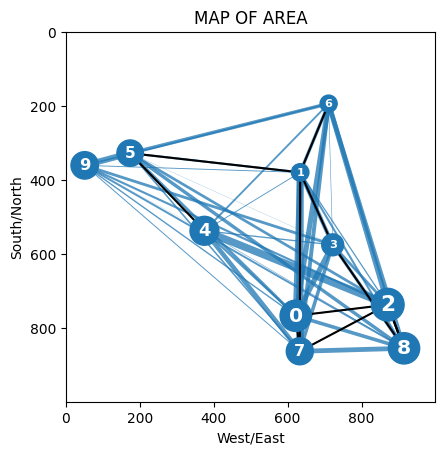

GENERATION #9
Best Score: 2150.6594777445875
Track Length: 1181.4260956872236
Average Score: 3568.2592864705875
SCORE TO BEAT: 442.51775011366965


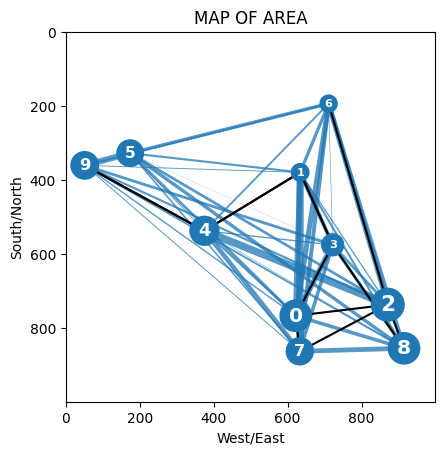

GENERATION #10
Best Score: 2038.005915318598
Track Length: 1181.4260956872236
Average Score: 3516.829078694146
SCORE TO BEAT: 442.51775011366965


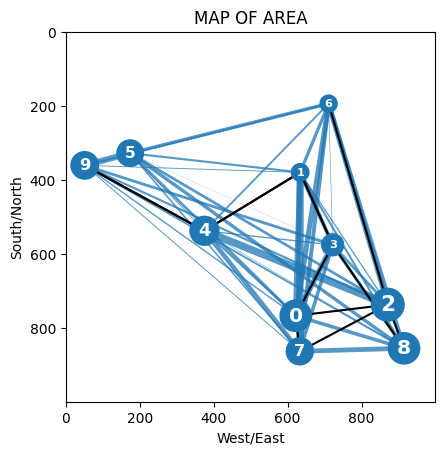

GENERATION #11
Best Score: 2038.005915318598
Track Length: 1147.3596394208826
Average Score: 3462.204540455673
SCORE TO BEAT: 442.51775011366965


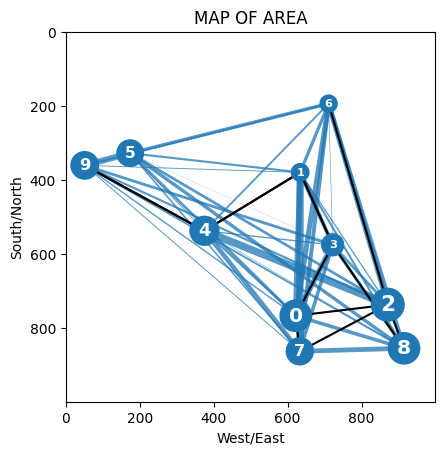

GENERATION #12
Best Score: 2038.005915318598
Track Length: 1347.0356625250636
Average Score: 3421.2884493384363
SCORE TO BEAT: 442.51775011366965


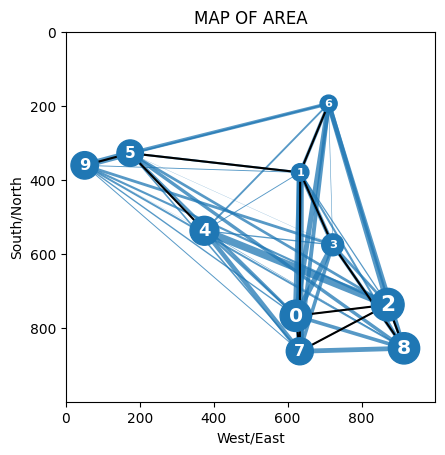

GENERATION #13
Best Score: 1866.7418619336102
Track Length: 1353.434990743589
Average Score: 3338.8027930374446
SCORE TO BEAT: 442.51775011366965


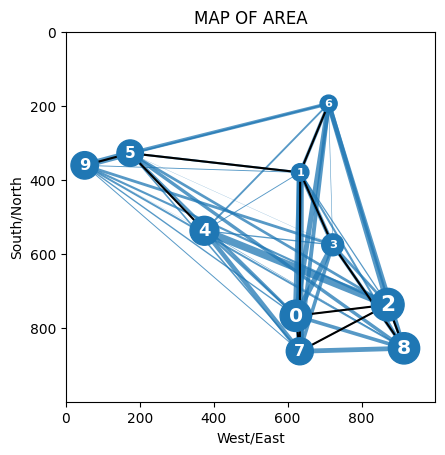

GENERATION #14
Best Score: 1866.7418619336102
Track Length: 1311.9882073680767
Average Score: 3306.810136958786
SCORE TO BEAT: 442.51775011366965


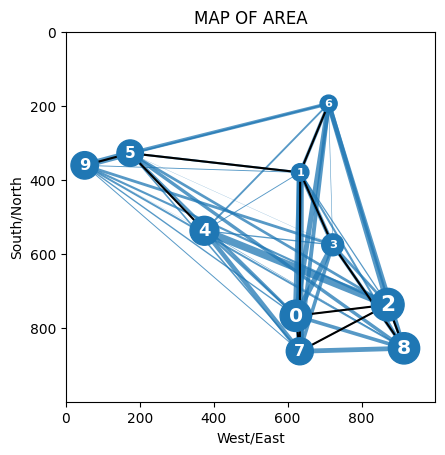

GENERATION #15
Best Score: 1866.7418619336102
Track Length: 1311.9882073680767
Average Score: 3254.5005111228197
SCORE TO BEAT: 442.51775011366965


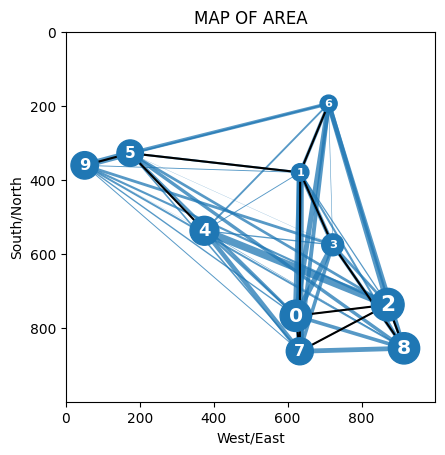

GENERATION #16
Best Score: 1866.7418619336102
Track Length: 1311.9882073680767
Average Score: 3211.127495192992
SCORE TO BEAT: 442.51775011366965


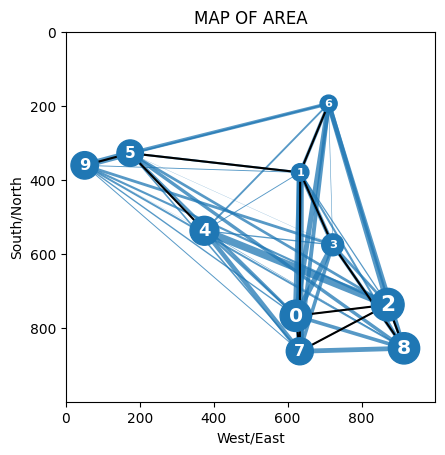

GENERATION #17
Best Score: 1866.7418619336102
Track Length: 1299.9018066942872
Average Score: 3152.605174232932
SCORE TO BEAT: 442.51775011366965


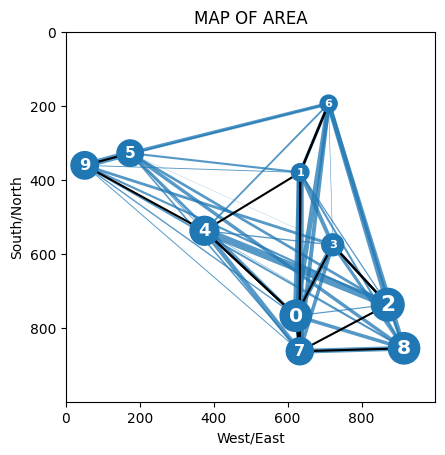

GENERATION #18
Best Score: 1741.3605724758086
Track Length: 1505.7860506672916
Average Score: 3110.7369998493223
SCORE TO BEAT: 442.51775011366965


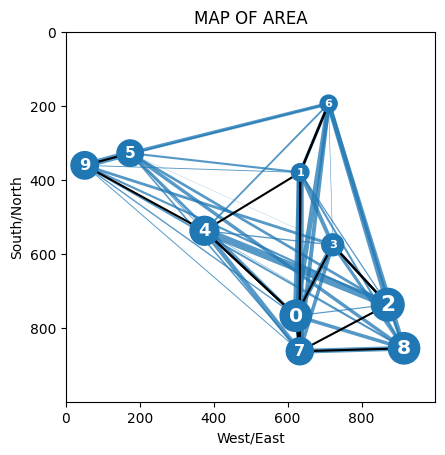

GENERATION #19
Best Score: 1741.3605724758086
Track Length: 1505.7860506672916
Average Score: 3088.126710904782
SCORE TO BEAT: 442.51775011366965


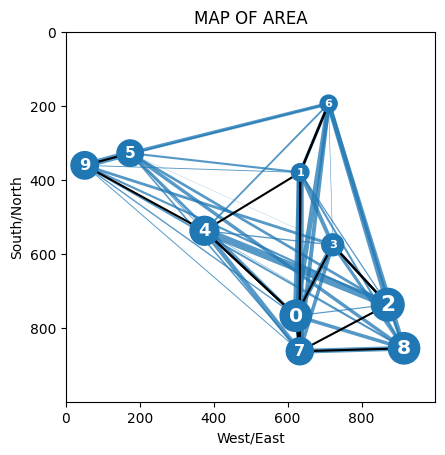

GENERATION #20
Best Score: 1741.3605724758086
Track Length: 1505.7860506672916
Average Score: 3056.137525098742
SCORE TO BEAT: 442.51775011366965


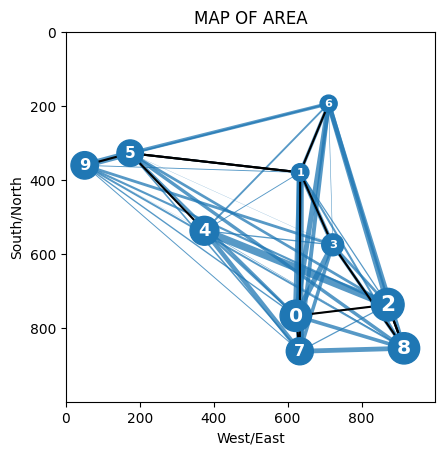

GENERATION #21
Best Score: 1629.1352535472486
Track Length: 1736.3006214731774
Average Score: 3040.8176968715347
SCORE TO BEAT: 442.51775011366965


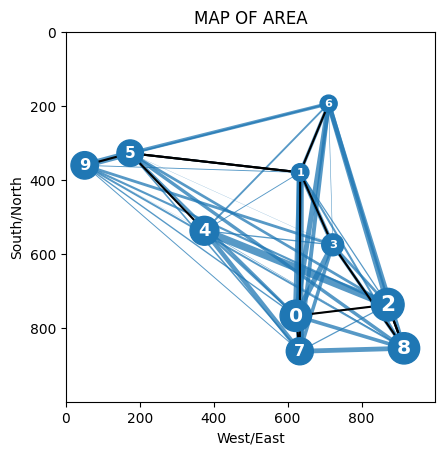

GENERATION #22
Best Score: 1629.1352535472486
Track Length: 1691.7742449654618
Average Score: 3027.3486371062204
SCORE TO BEAT: 442.51775011366965


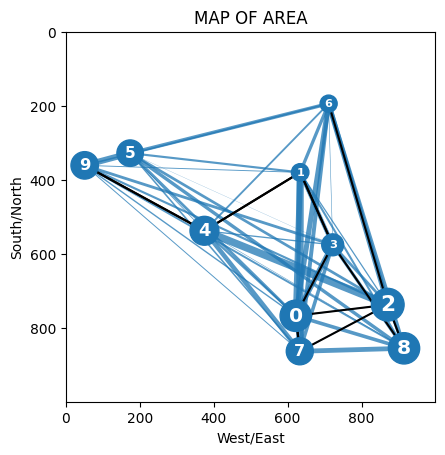

GENERATION #23
Best Score: 1612.6792462827182
Track Length: 1622.0525152431997
Average Score: 3011.459876876159
SCORE TO BEAT: 442.51775011366965


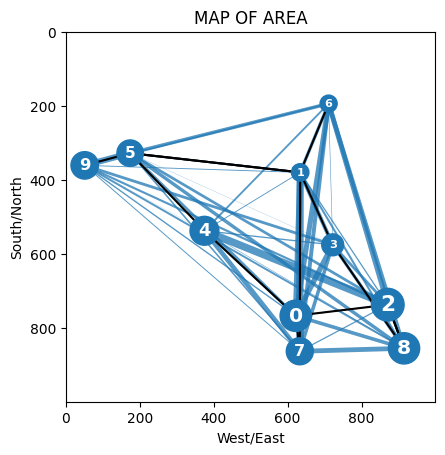

GENERATION #24
Best Score: 1286.6842825980611
Track Length: 1599.4984366014148
Average Score: 2980.925631918848
SCORE TO BEAT: 442.51775011366965


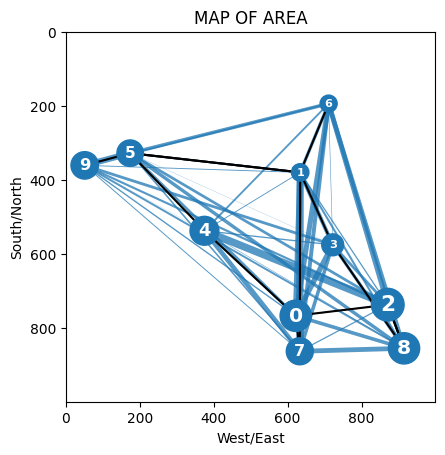

GENERATION #25
Best Score: 1286.6842825980611
Track Length: 1296.9862015179492
Average Score: 2958.116201763301
SCORE TO BEAT: 442.51775011366965


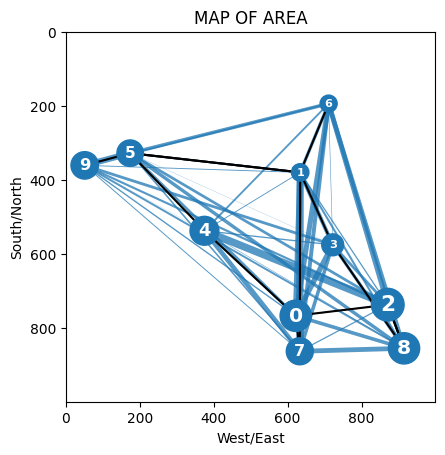

GENERATION #26
Best Score: 1286.6842825980611
Track Length: 1177.1692764909553
Average Score: 2935.1825285757136
SCORE TO BEAT: 442.51775011366965


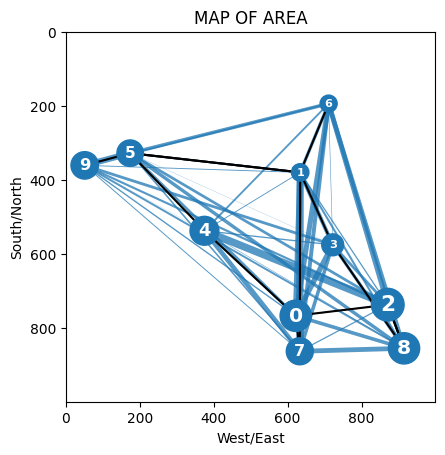

GENERATION #27
Best Score: 1286.6842825980611
Track Length: 1561.0077670862509
Average Score: 2887.335021226412
SCORE TO BEAT: 442.51775011366965


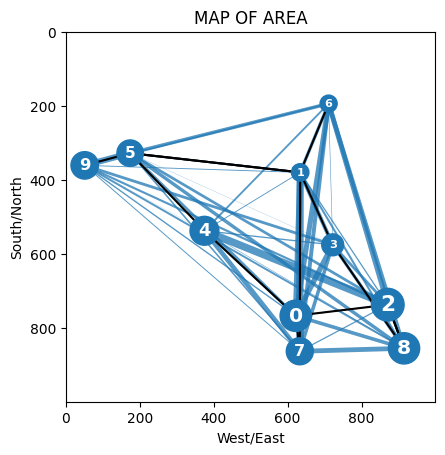

GENERATION #28
Best Score: 1286.6842825980611
Track Length: 1611.8238097910246
Average Score: 2843.6335290664624
SCORE TO BEAT: 442.51775011366965


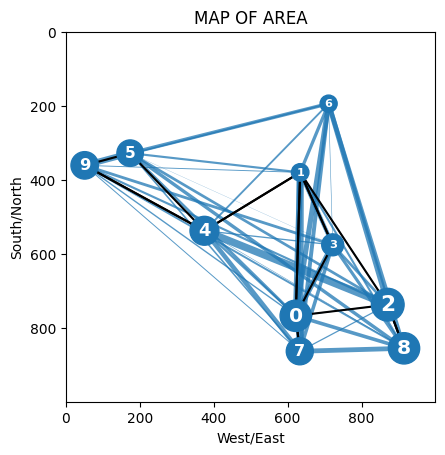

GENERATION #29
Best Score: 1228.8402865272176
Track Length: 1308.3001185108965
Average Score: 2784.6609213156794
SCORE TO BEAT: 442.51775011366965


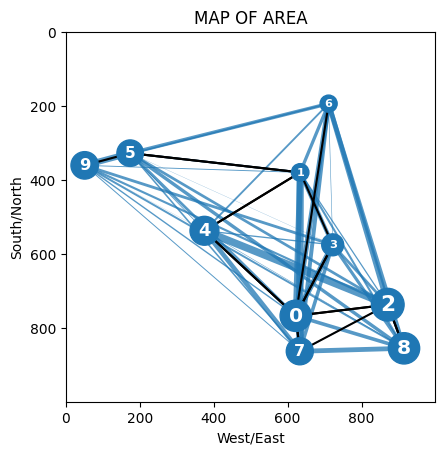

GENERATION #30
Best Score: 1171.133094781026
Track Length: 1308.3001185108965
Average Score: 2774.6307271666606
SCORE TO BEAT: 442.51775011366965


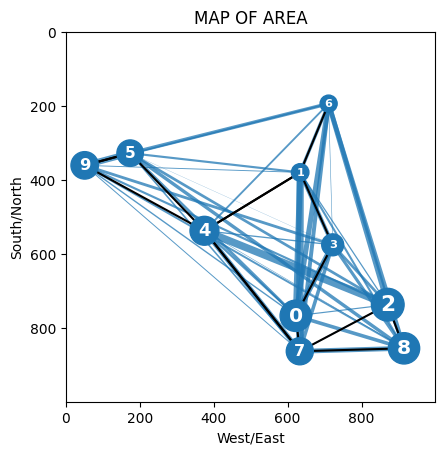

GENERATION #31
Best Score: 836.695079613854
Track Length: 1308.3001185108965
Average Score: 2778.0366280569688
SCORE TO BEAT: 442.51775011366965


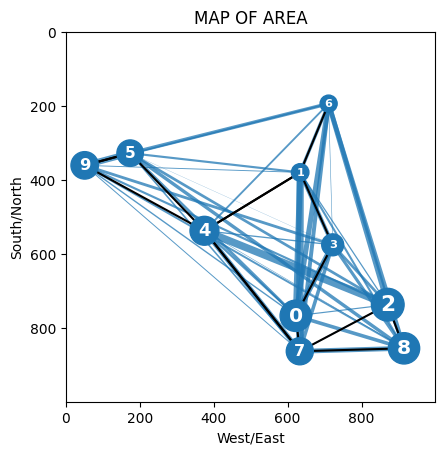

GENERATION #32
Best Score: 836.695079613854
Track Length: 1510.804608772791
Average Score: 2708.815143117188
SCORE TO BEAT: 442.51775011366965


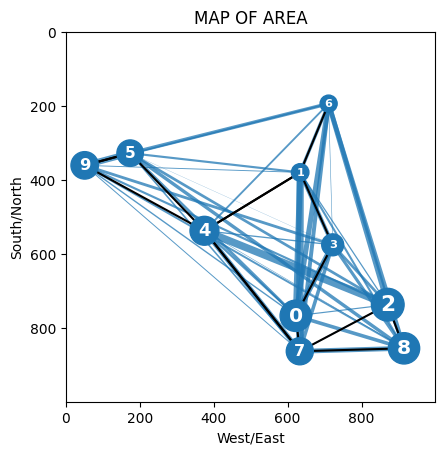

GENERATION #33
Best Score: 836.695079613854
Track Length: 1360.0344015374883
Average Score: 2712.1296633894094
SCORE TO BEAT: 442.51775011366965


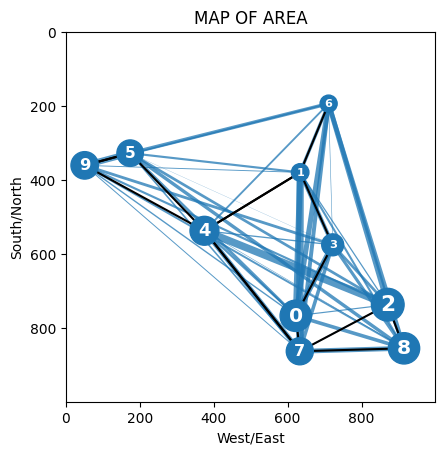

GENERATION #34
Best Score: 836.695079613854
Track Length: 1268.2424683227866
Average Score: 2679.0325107355434
SCORE TO BEAT: 442.51775011366965


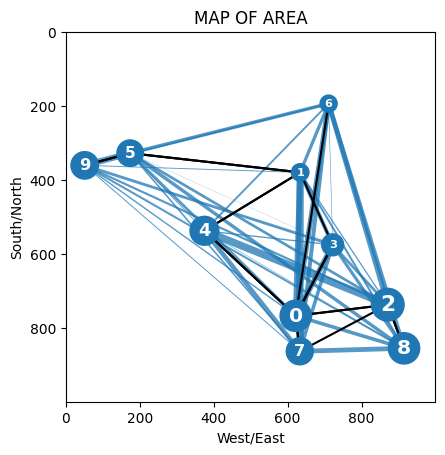

GENERATION #35
Best Score: 815.591628985399
Track Length: 1305.1312847317722
Average Score: 2615.042241010343
SCORE TO BEAT: 442.51775011366965


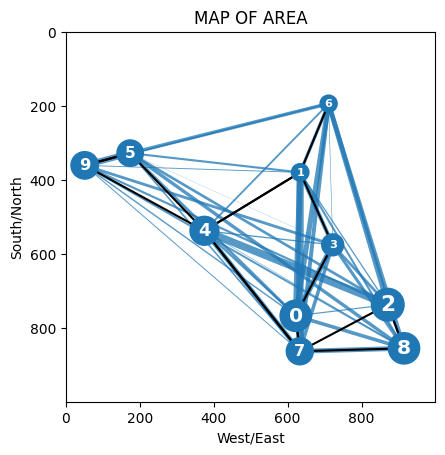

GENERATION #36
Best Score: 780.8523032830917
Track Length: 1305.1312847317722
Average Score: 2572.7416037583134
SCORE TO BEAT: 442.51775011366965


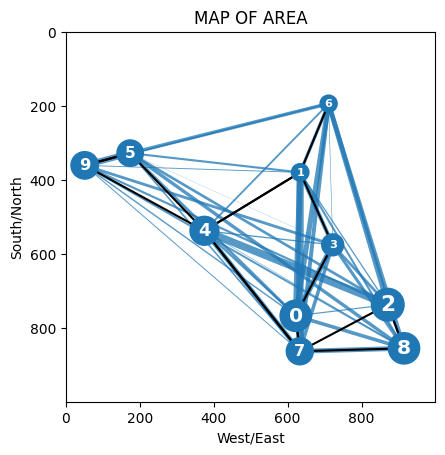

GENERATION #37
Best Score: 780.8523032830917
Track Length: 1363.1424364566374
Average Score: 2548.357211423467
SCORE TO BEAT: 442.51775011366965


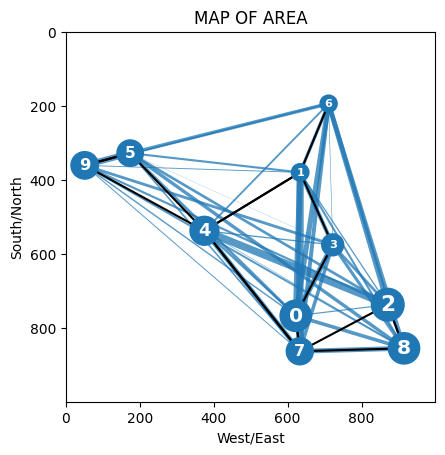

GENERATION #38
Best Score: 780.8523032830917
Track Length: 1002.1827845009373
Average Score: 2525.176264653192
SCORE TO BEAT: 442.51775011366965


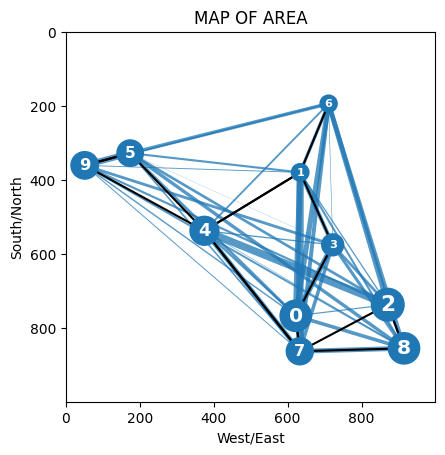

GENERATION #39
Best Score: 780.8523032830917
Track Length: 1048.9555793707686
Average Score: 2488.2629774818543
SCORE TO BEAT: 442.51775011366965


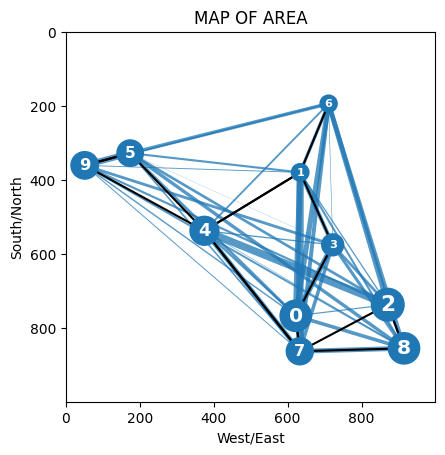

GENERATION #40
Best Score: 780.8523032830917
Track Length: 1048.9555793707686
Average Score: 2456.090215007402
SCORE TO BEAT: 442.51775011366965


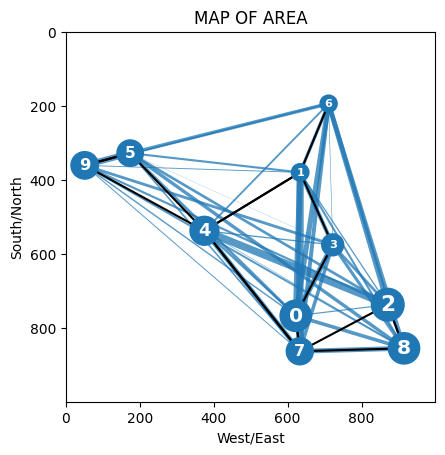

GENERATION #41
Best Score: 780.8523032830917
Track Length: 1391.9140031615875
Average Score: 2426.5947765625374
SCORE TO BEAT: 442.51775011366965


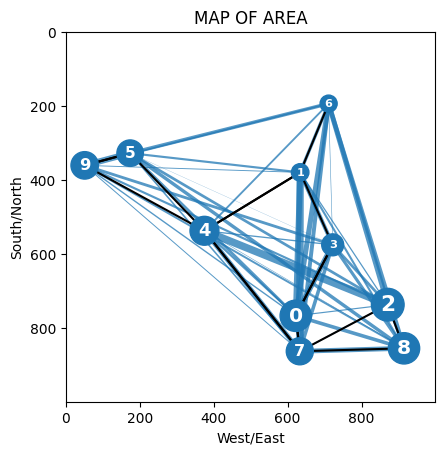

GENERATION #42
Best Score: 765.6605122333832
Track Length: 1308.9476971520685
Average Score: 2357.43290993551
SCORE TO BEAT: 442.51775011366965


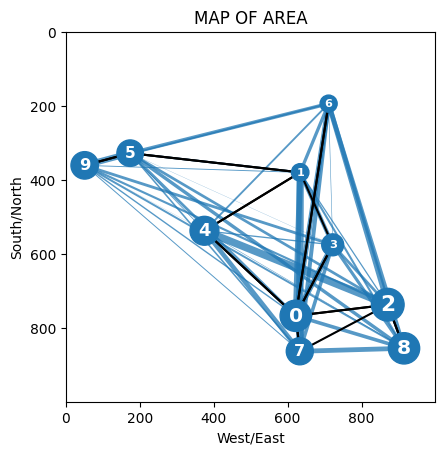

GENERATION #43
Best Score: 675.1207225298718
Track Length: 1432.3790982956657
Average Score: 2348.9592574846733
SCORE TO BEAT: 442.51775011366965


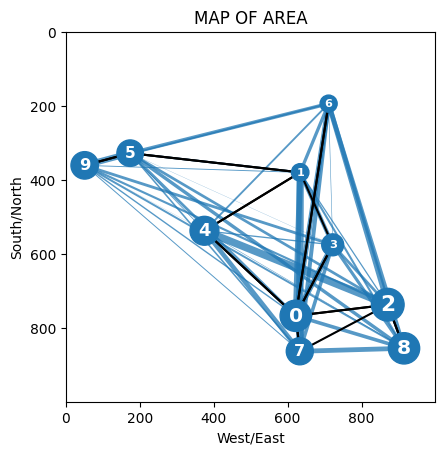

GENERATION #44
Best Score: 675.1207225298718
Track Length: 1420.4393240702252
Average Score: 2343.5646483847268
SCORE TO BEAT: 442.51775011366965


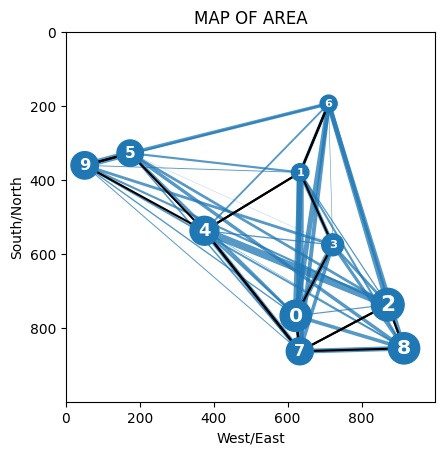

GENERATION #45
Best Score: 625.5792953221373
Track Length: 1420.4393240702252
Average Score: 2267.905172881365
SCORE TO BEAT: 442.51775011366965


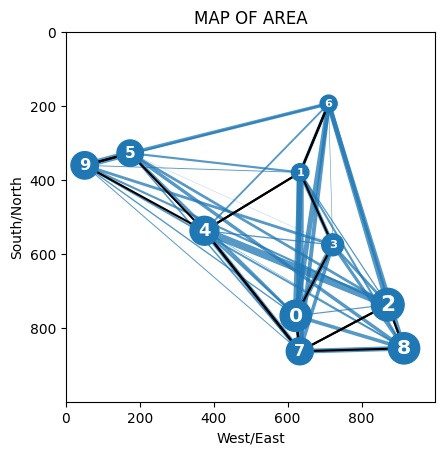

GENERATION #46
Best Score: 625.5792953221373
Track Length: 1071.1710585565102
Average Score: 2277.681275222371
SCORE TO BEAT: 442.51775011366965


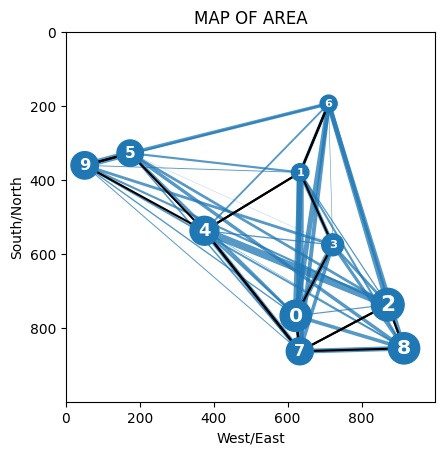

GENERATION #47
Best Score: 625.5792953221373
Track Length: 875.8332394602439
Average Score: 2281.5515742454863
SCORE TO BEAT: 442.51775011366965


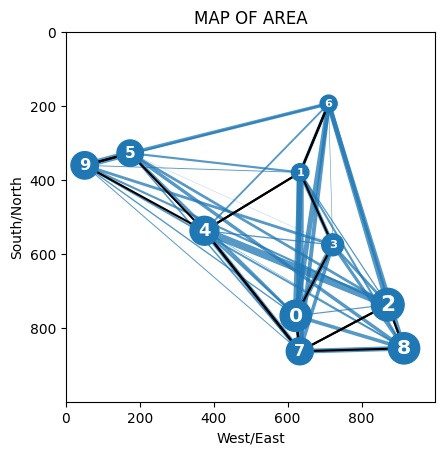

GENERATION #48
Best Score: 625.5792953221373
Track Length: 1294.315196825598
Average Score: 2261.6787279332957
SCORE TO BEAT: 442.51775011366965


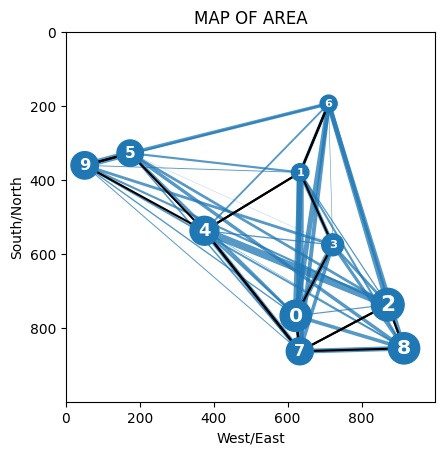

GENERATION #49
Best Score: 625.5792953221373
Track Length: 1294.315196825598
Average Score: 2214.4038426471343
SCORE TO BEAT: 442.51775011366965


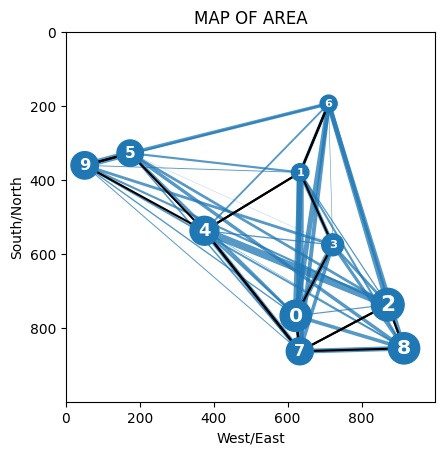

GENERATION #50
Best Score: 625.5792953221373
Track Length: 1197.39737689658
Average Score: 2212.526507258155
SCORE TO BEAT: 442.51775011366965


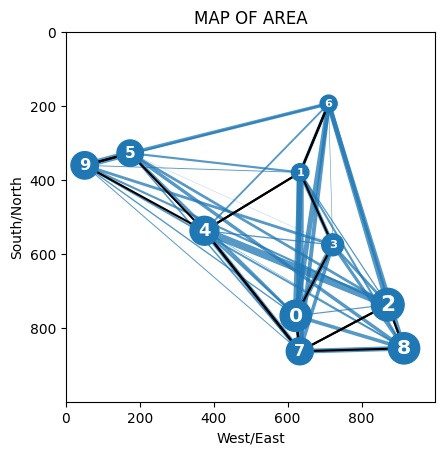

GENERATION #51
Best Score: 625.5792953221373
Track Length: 1567.9594877020093
Average Score: 2192.0724692088593
SCORE TO BEAT: 442.51775011366965


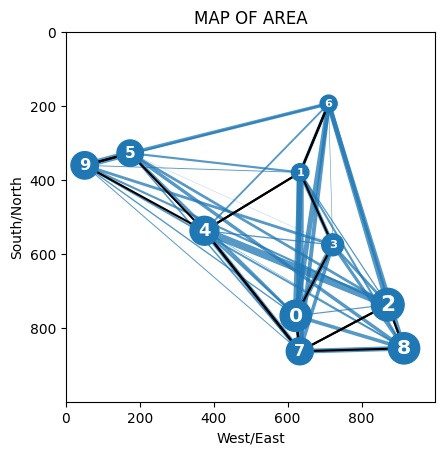

GENERATION #52
Best Score: 625.5792953221373
Track Length: 1226.1077553139385
Average Score: 2196.973002300615
SCORE TO BEAT: 442.51775011366965


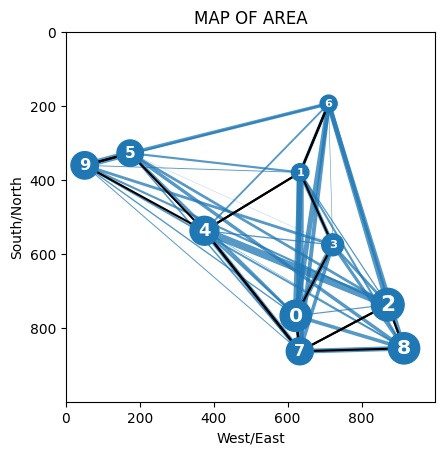

GENERATION #53
Best Score: 625.5792953221373
Track Length: 1546.4903980502809
Average Score: 2161.7655191148624
SCORE TO BEAT: 442.51775011366965


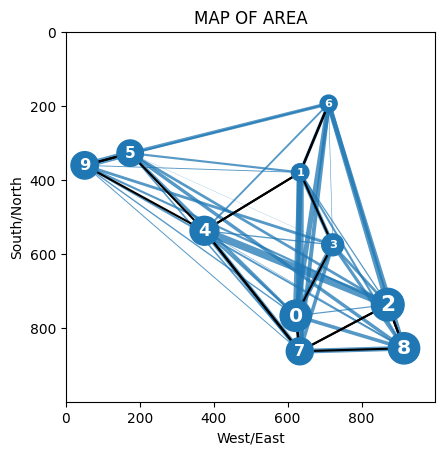

GENERATION #54
Best Score: 624.3116366790811
Track Length: 1608.1709486046682
Average Score: 2136.4552031780304
SCORE TO BEAT: 442.51775011366965


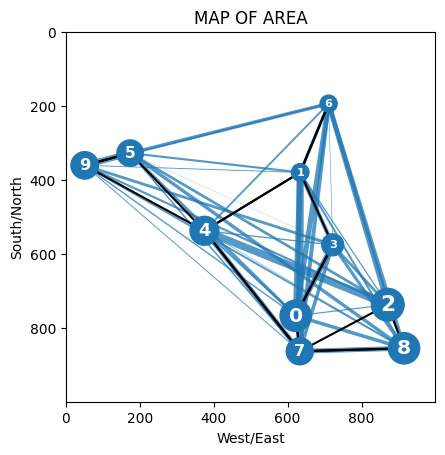

GENERATION #55
Best Score: 605.4805402972911
Track Length: 1577.2326311086656
Average Score: 2149.1329022755845
SCORE TO BEAT: 442.51775011366965


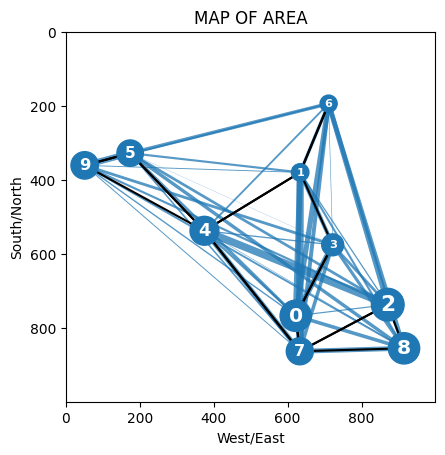

GENERATION #56
Best Score: 590.8725940002539
Track Length: 1577.2326311086656
Average Score: 2198.54895155937
SCORE TO BEAT: 442.51775011366965


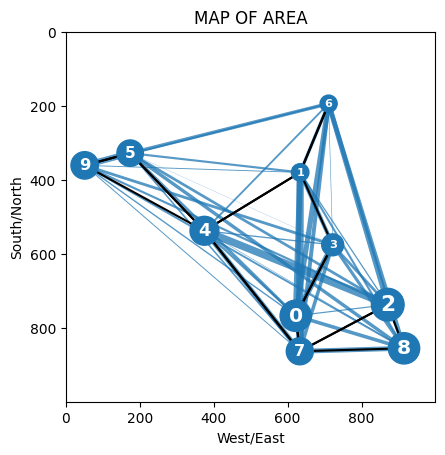

GENERATION #57
Best Score: 590.8725940002539
Track Length: 1606.6729415362297
Average Score: 2200.0388860963362
SCORE TO BEAT: 442.51775011366965


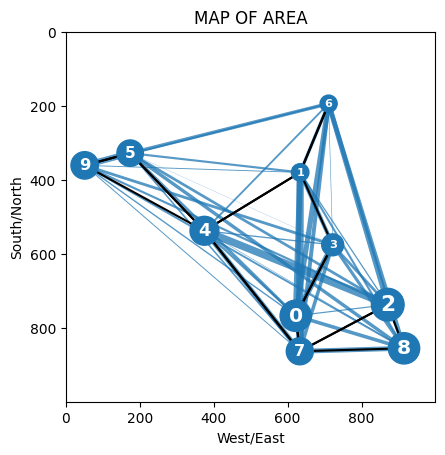

GENERATION #58
Best Score: 590.8725940002539
Track Length: 1792.9346308590343
Average Score: 2176.4677281541117
SCORE TO BEAT: 442.51775011366965


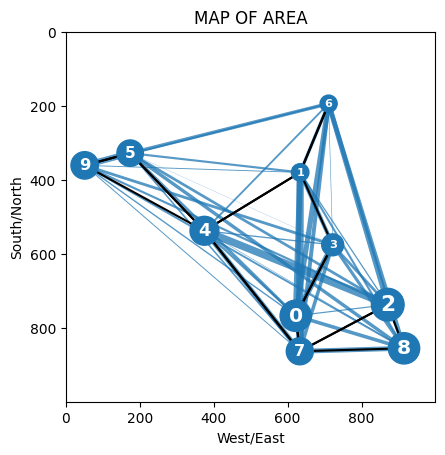

GENERATION #59
Best Score: 590.8725940002539
Track Length: 1154.4995300232074
Average Score: 2101.9249206641093
SCORE TO BEAT: 442.51775011366965


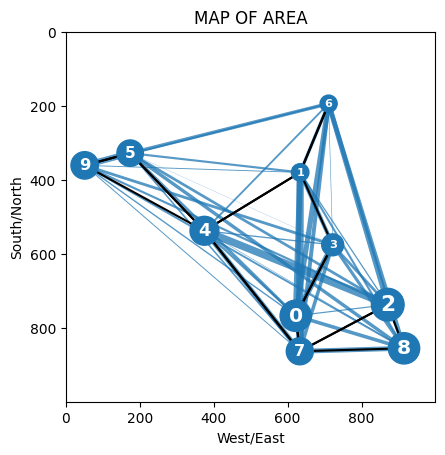

GENERATION #60
Best Score: 590.8725940002539
Track Length: 1154.4995300232074
Average Score: 2104.6747641397046
SCORE TO BEAT: 442.51775011366965


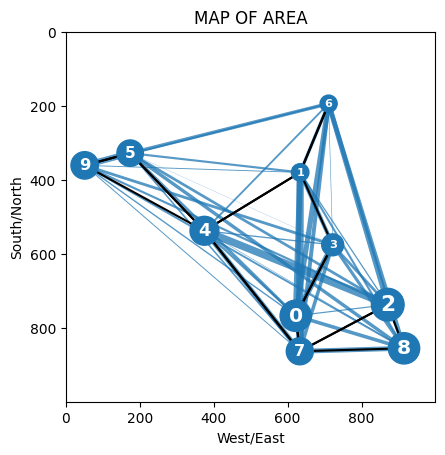

GENERATION #61
Best Score: 590.8725940002539
Track Length: 1421.8554152956826
Average Score: 2043.939250846611
SCORE TO BEAT: 442.51775011366965


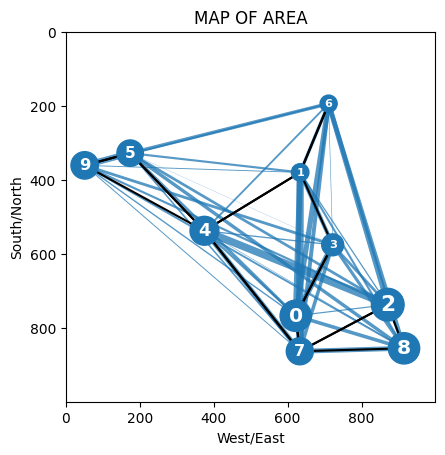

GENERATION #62
Best Score: 590.8725940002539
Track Length: 1421.8554152956826
Average Score: 2007.846318389015
SCORE TO BEAT: 442.51775011366965


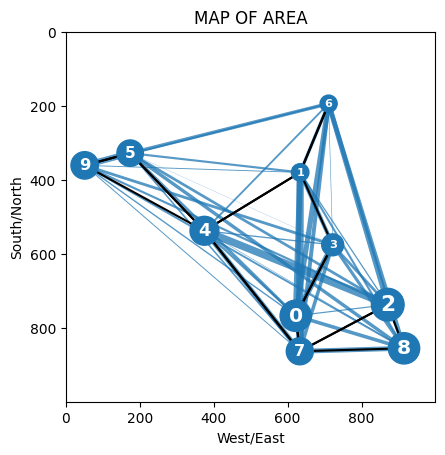

GENERATION #63
Best Score: 590.8725940002539
Track Length: 1421.8554152956826
Average Score: 2046.1651271301603
SCORE TO BEAT: 442.51775011366965


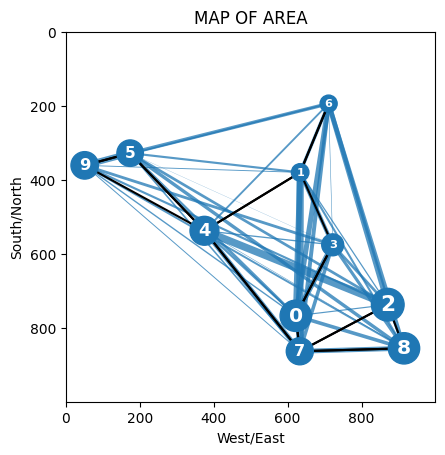

GENERATION #64
Best Score: 576.8706665049309
Track Length: 1564.548443878071
Average Score: 2061.151560038972
SCORE TO BEAT: 442.51775011366965


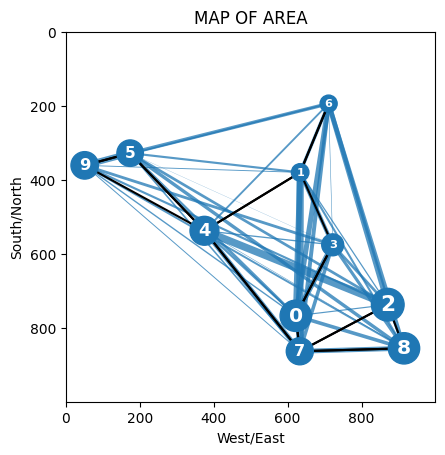

GENERATION #65
Best Score: 576.8706665049309
Track Length: 1660.4638425993971
Average Score: 2050.9853027121803
SCORE TO BEAT: 442.51775011366965


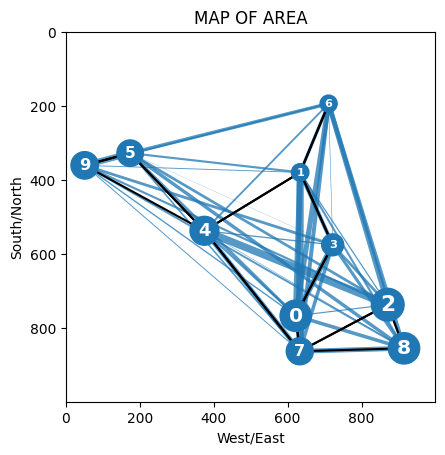

GENERATION #66
Best Score: 566.050656514275
Track Length: 1676.9247294933923
Average Score: 2046.2045053758109
SCORE TO BEAT: 442.51775011366965


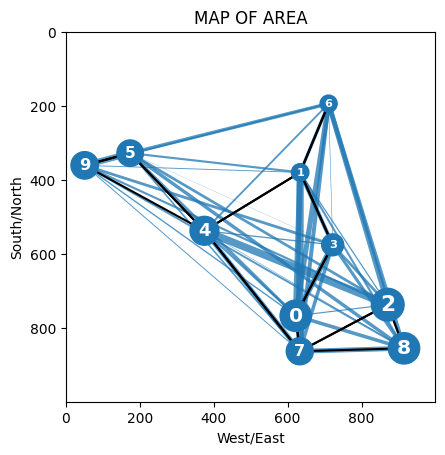

GENERATION #67
Best Score: 566.050656514275
Track Length: 1897.441660658117
Average Score: 2024.3969983057495
SCORE TO BEAT: 442.51775011366965


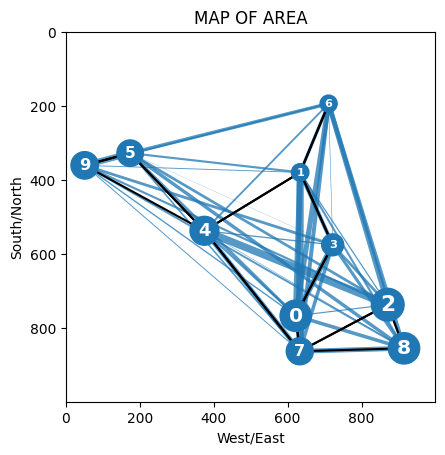

GENERATION #68
Best Score: 566.050656514275
Track Length: 1642.4381358190428
Average Score: 1982.072138111116
SCORE TO BEAT: 442.51775011366965


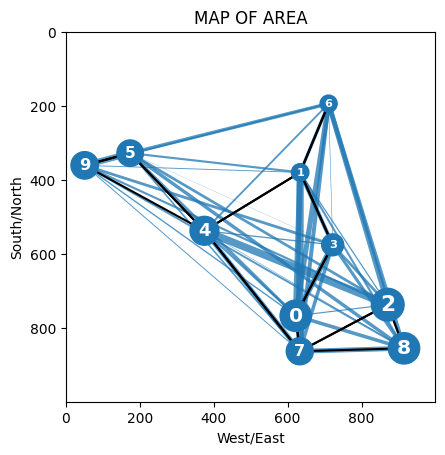

GENERATION #69
Best Score: 566.050656514275
Track Length: 1113.0871352675117
Average Score: 1992.6457635862091
SCORE TO BEAT: 442.51775011366965


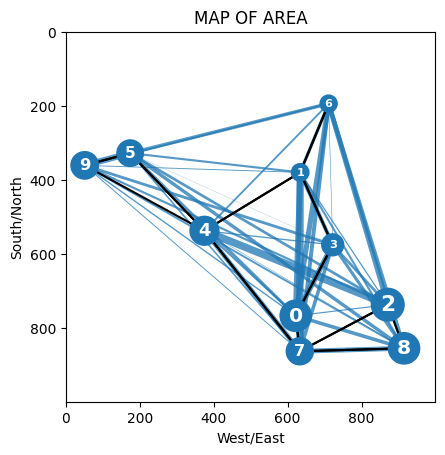

GENERATION #70
Best Score: 552.0487290189521
Track Length: 1664.448137404297
Average Score: 1968.3628476764022
SCORE TO BEAT: 442.51775011366965


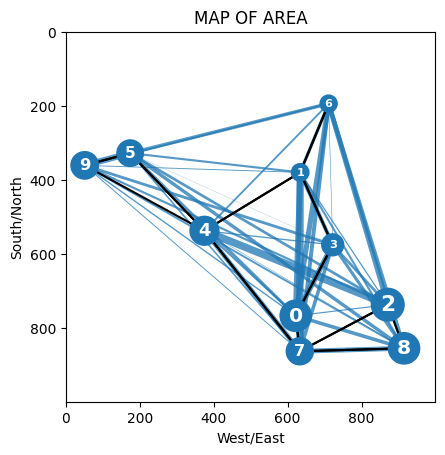

GENERATION #71
Best Score: 552.0487290189521
Track Length: 1317.8343689768467
Average Score: 1973.1533907539197
SCORE TO BEAT: 442.51775011366965


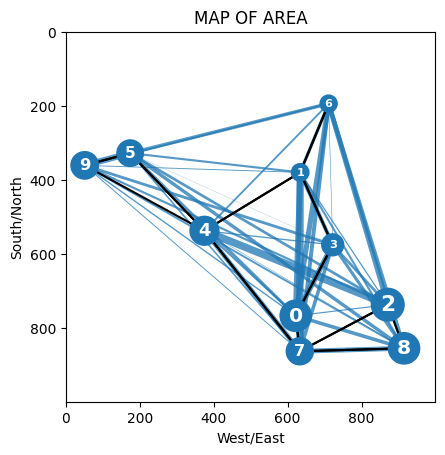

GENERATION #72
Best Score: 552.0487290189521
Track Length: 1276.3085662722
Average Score: 1967.7978244778824
SCORE TO BEAT: 442.51775011366965


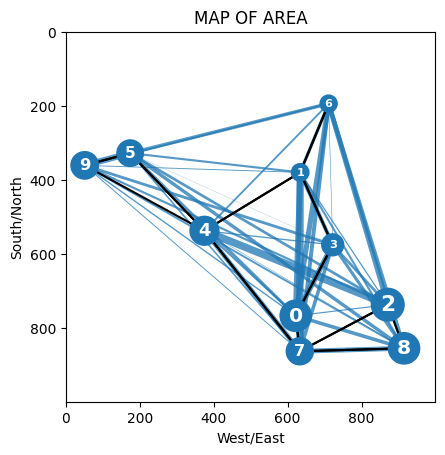

GENERATION #73
Best Score: 552.0487290189521
Track Length: 1625.7732827697357
Average Score: 1963.3461008740542
SCORE TO BEAT: 442.51775011366965


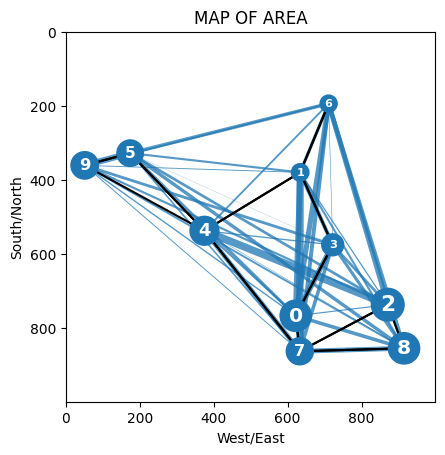

GENERATION #74
Best Score: 552.0487290189521
Track Length: 1351.2747653238805
Average Score: 1993.4131688299203
SCORE TO BEAT: 442.51775011366965


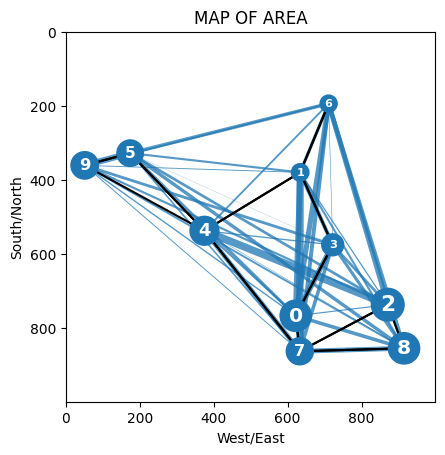

GENERATION #75
Best Score: 552.0487290189521
Track Length: 1511.2869093348554
Average Score: 1973.083348071436
SCORE TO BEAT: 442.51775011366965


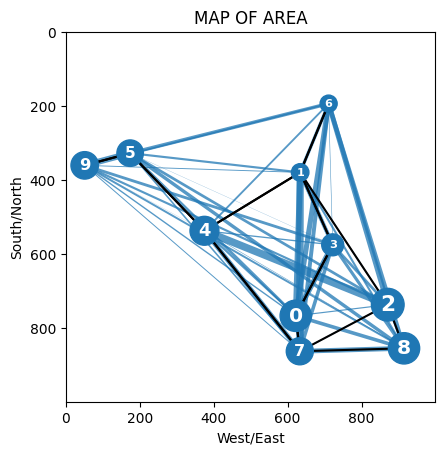

GENERATION #76
Best Score: 549.6150354466423
Track Length: 1656.4430599425812
Average Score: 1986.4387677121808
SCORE TO BEAT: 442.51775011366965


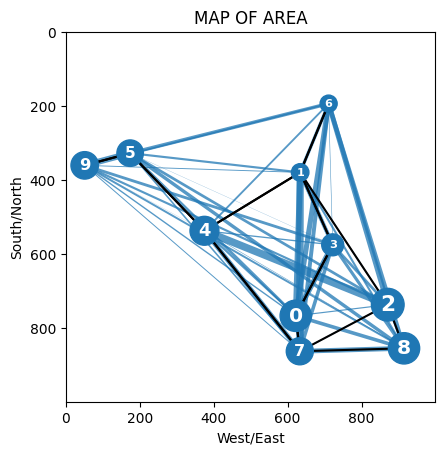

GENERATION #77
Best Score: 549.6150354466423
Track Length: 1558.214988585446
Average Score: 1965.1462054197355
SCORE TO BEAT: 442.51775011366965


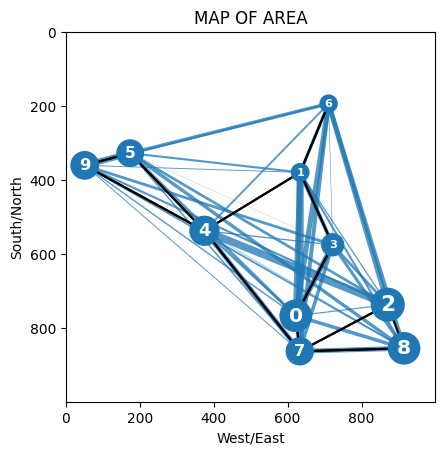

GENERATION #78
Best Score: 547.5769671942137
Track Length: 1393.5067052477427
Average Score: 1889.5255448657228
SCORE TO BEAT: 442.51775011366965


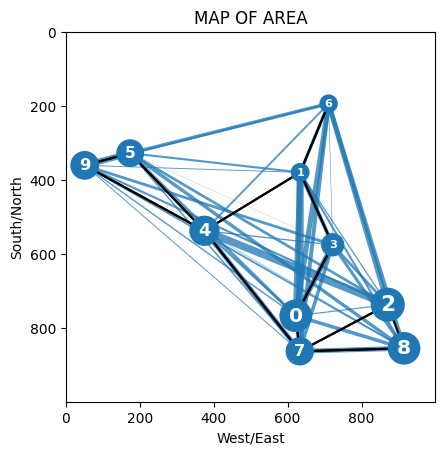

GENERATION #79
Best Score: 547.5769671942137
Track Length: 1198.7298804786556
Average Score: 1878.5707070060475
SCORE TO BEAT: 442.51775011366965


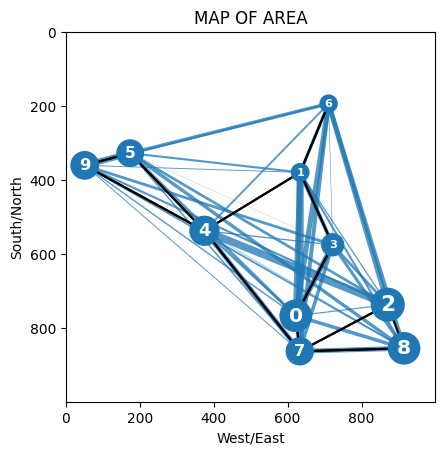

GENERATION #80
Best Score: 547.5769671942137
Track Length: 1559.3986228155413
Average Score: 1833.6392855682293
SCORE TO BEAT: 442.51775011366965


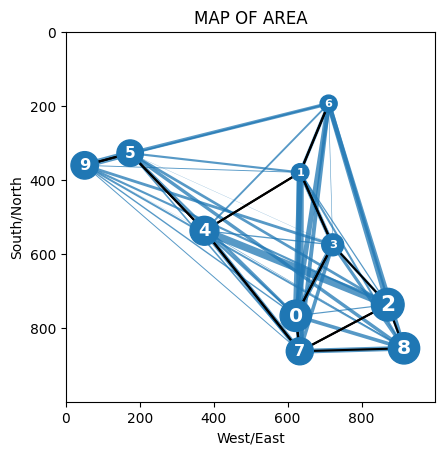

GENERATION #81
Best Score: 525.8439528948838
Track Length: 1559.3986228155413
Average Score: 1863.2868463323214
SCORE TO BEAT: 442.51775011366965


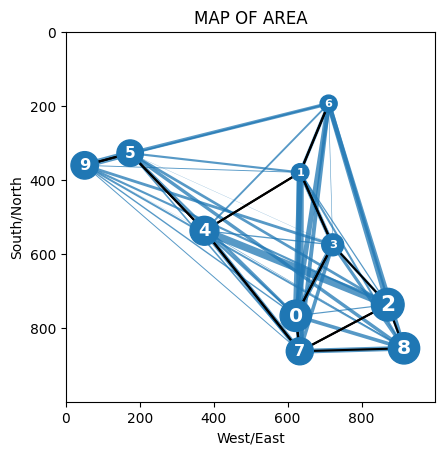

GENERATION #82
Best Score: 525.8439528948838
Track Length: 1559.3986228155413
Average Score: 1866.3599293381621
SCORE TO BEAT: 442.51775011366965


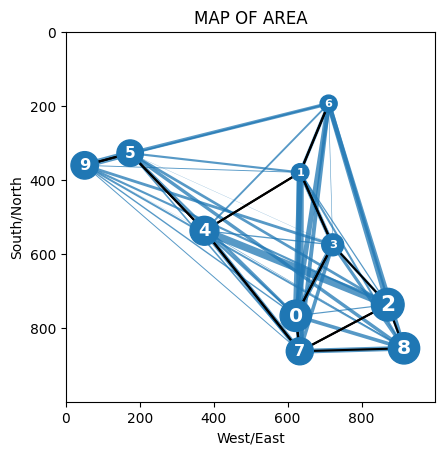

GENERATION #83
Best Score: 525.8439528948838
Track Length: 1335.2594838454404
Average Score: 1885.5944443545884
SCORE TO BEAT: 442.51775011366965


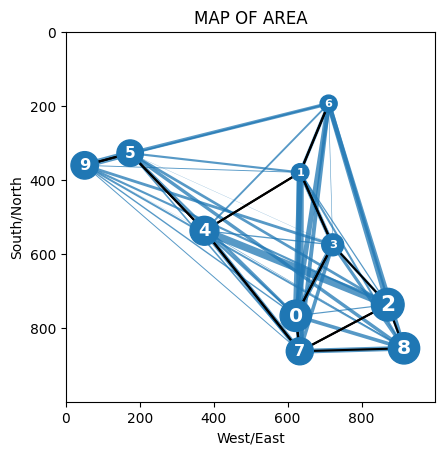

GENERATION #84
Best Score: 525.8439528948838
Track Length: 1398.3845609940472
Average Score: 1971.0896300275228
SCORE TO BEAT: 442.51775011366965


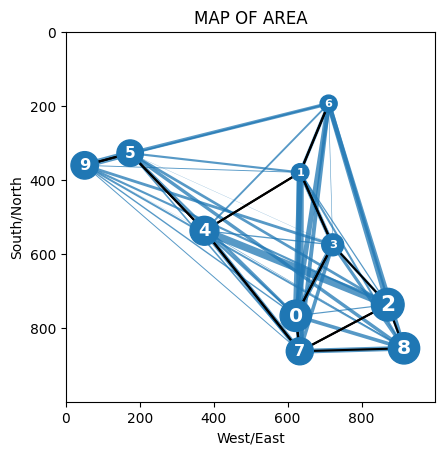

GENERATION #85
Best Score: 525.8439528948838
Track Length: 1066.5419021021407
Average Score: 1937.9897903587112
SCORE TO BEAT: 442.51775011366965


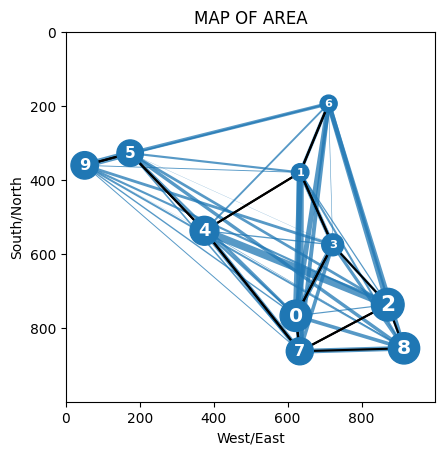

GENERATION #86
Best Score: 525.8439528948838
Track Length: 1066.5419021021407
Average Score: 1934.357785804694
SCORE TO BEAT: 442.51775011366965


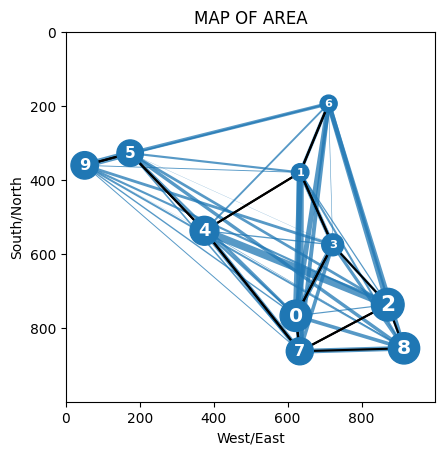

GENERATION #87
Best Score: 525.8439528948838
Track Length: 1066.5419021021407
Average Score: 1949.7307584999894
SCORE TO BEAT: 442.51775011366965


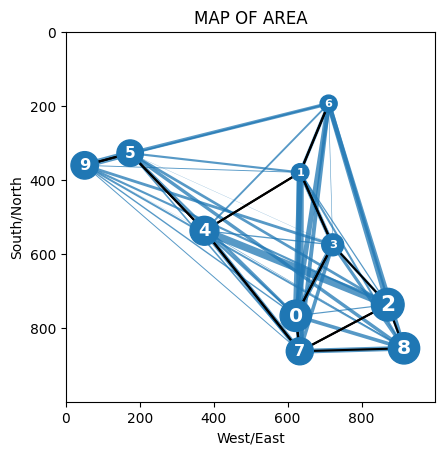

GENERATION #88
Best Score: 525.8439528948838
Track Length: 1584.5825676697136
Average Score: 1961.1371428767784
SCORE TO BEAT: 442.51775011366965


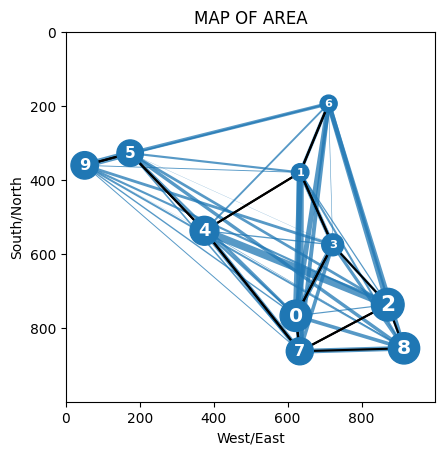

GENERATION #89
Best Score: 525.8439528948838
Track Length: 1584.5825676697136
Average Score: 1938.9122892362075
SCORE TO BEAT: 442.51775011366965


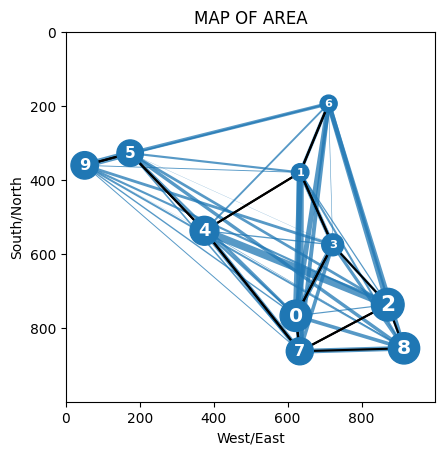

GENERATION #90
Best Score: 525.8439528948838
Track Length: 844.1569065961056
Average Score: 1924.2884394827986
SCORE TO BEAT: 442.51775011366965


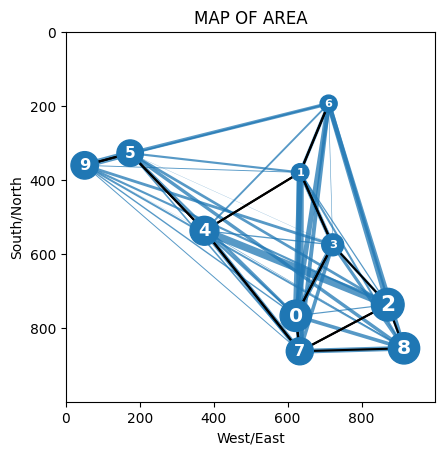

GENERATION #91
Best Score: 525.8439528948838
Track Length: 1518.6819246643756
Average Score: 1891.0845367468262
SCORE TO BEAT: 442.51775011366965


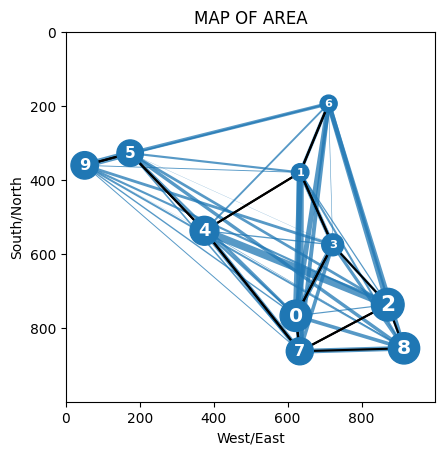

GENERATION #92
Best Score: 525.8439528948838
Track Length: 1447.9029185712648
Average Score: 1913.6371027321345
SCORE TO BEAT: 442.51775011366965


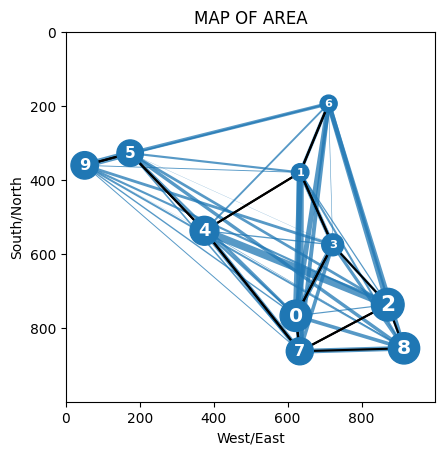

GENERATION #93
Best Score: 525.8439528948838
Track Length: 1384.7846730924314
Average Score: 1902.1671636550277
SCORE TO BEAT: 442.51775011366965


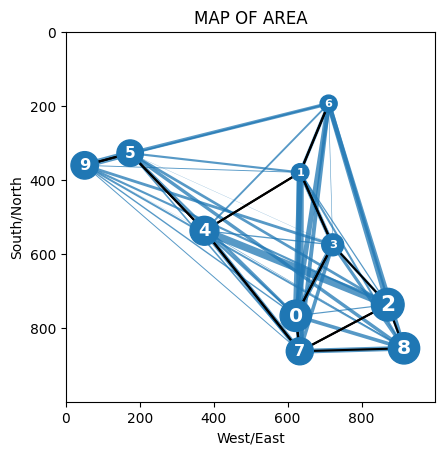

GENERATION #94
Best Score: 525.8439528948838
Track Length: 1219.1252690483875
Average Score: 1919.9479558978437
SCORE TO BEAT: 442.51775011366965


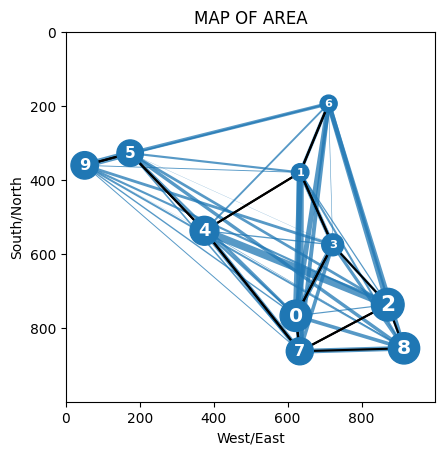

GENERATION #95
Best Score: 525.8439528948838
Track Length: 1388.7714165919344
Average Score: 1939.025929334098
SCORE TO BEAT: 442.51775011366965


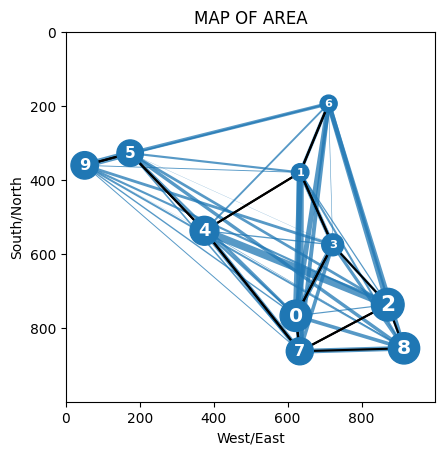

GENERATION #96
Best Score: 525.8439528948838
Track Length: 1313.1120383636628
Average Score: 1945.1205222588899
SCORE TO BEAT: 442.51775011366965


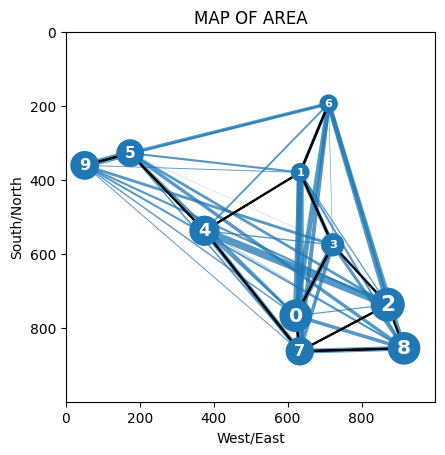

GENERATION #97
Best Score: 520.3596093026239
Track Length: 1307.7330366868002
Average Score: 1935.4080821527841
SCORE TO BEAT: 442.51775011366965


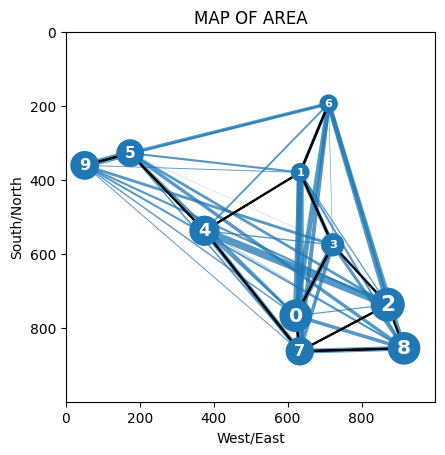

GENERATION #98
Best Score: 520.3596093026239
Track Length: 1247.9886319018597
Average Score: 1907.449244449378
SCORE TO BEAT: 442.51775011366965


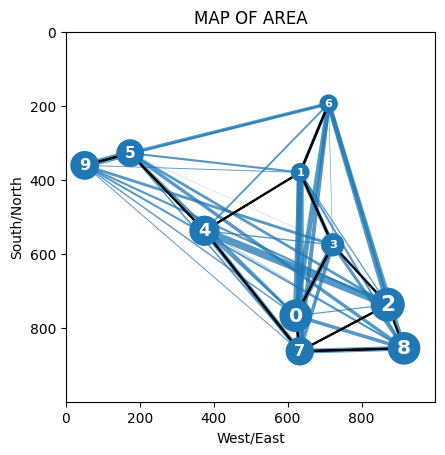

GENERATION #99
Best Score: 520.3596093026239
Track Length: 1247.9886319018597
Average Score: 1929.9291913857485
SCORE TO BEAT: 442.51775011366965


In [ ]:
for gen in range(NUM_GENERATIONS):
  # Evaluate population
  best_idx, best_gen_score, best_track_len, best_line, avg_score, LINES_SCORES = evaluate(LINES_POP)

  # Display results
  plot_system(CANVAS, best_line)
  print(f'\033[1mGENERATION #{gen}\033[0m')
  print(f'Best Score: {best_gen_score}')
  print(f'Track Length: {best_track_len}')
  print(f'Average Score: {avg_score}')
  print(f'SCORE TO BEAT: {BEST_SCORE}')

  # Selection (parents and elites)
  parent_idxs, mutated_idxs, elite_idxs = selection(LINES_SCORES)
  parents = LINES_POP[parent_idxs]
  mutants = LINES_POP[mutated_idxs]
  elites = LINES_POP[elite_idxs]

  # Crossover
  children = crossover(parents)

  # Mutation
  mutated = mutation(mutants)

  # Next gen
  del LINES_POP
  LINES_POP = np.concatenate((children, mutants), axis=0)
  LINES_POP = np.concatenate((LINES_POP, elites), axis=0)

# **4. Results**